#Imports

In [77]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import csv
import math

#Loading csv data and applying it to a networkX graph

In [78]:
with open('/content/musae_ENGB_target.csv', 'r') as nodecsv: # Open the file
    nodereader = csv.reader(nodecsv) # Read the csv
    # Retrieve the data (using Python list comprhension and list slicing to remove the header row, see footnote 3)
    nodes = [n for n in nodereader][1:]

node_names = [n[5] for n in nodes] # Get a list of only the node names

with open('/content/musae_ENGB_edges.csv', 'r') as edgecsv: # Open the file
    edgereader = csv.reader(edgecsv) # Read the csv
    edges = [tuple(e) for e in edgereader][1:] # Retrieve the data

In [79]:
print(len(node_names))
print(node_names)

7126
['2299', '153', '397', '5623', '5875', '3346', '6930', '6367', '1434', '4470', '5122', '4790', '4919', '575', '639', '7012', '6445', '1170', '326', '4956', '2639', '5028', '6277', '6784', '49', '4526', '4108', '1171', '2568', '5731', '1760', '6707', '2019', '634', '4670', '2399', '5737', '6974', '6919', '240', '5646', '158', '3298', '2354', '1161', '1869', '3499', '5655', '5295', '6468', '3872', '5676', '72', '544', '4228', '2430', '2677', '576', '5986', '3707', '809', '593', '2456', '6911', '3362', '7101', '7060', '6080', '5771', '5914', '6794', '3361', '3260', '936', '3837', '2233', '4568', '3468', '5540', '6304', '3284', '1376', '4702', '6480', '5021', '6756', '2533', '6062', '5956', '5768', '1636', '1524', '1385', '119', '3213', '4487', '839', '6165', '1150', '701', '1794', '3998', '4923', '542', '7074', '4315', '1481', '5915', '948', '799', '6513', '413', '3811', '7055', '1923', '5383', '1920', '3555', '6861', '1893', '5490', '3977', '2265', '661', '4449', '5038', '6720', '37

In [80]:
print(len(edges))

35324


In [81]:
G = nx.Graph()

In [82]:
G.add_nodes_from(node_names)
G.add_edges_from(edges)

In [83]:
days_dict = {}
mature_dict = {}
views_dict = {}
partner_dict = {}
new_id_dict = {}

In [84]:
for node in nodes: # Loop through the list, one row at a time
    days_dict[node[5]] = node[1]
    mature_dict[node[5]] = node[2]
    views_dict[node[5]] = node[3]
    partner_dict[node[5]] = node[4]
    new_id_dict[node[5]] = node[5]

In [85]:
nx.set_node_attributes(G, days_dict, 'days_streaming')
nx.set_node_attributes(G, mature_dict, 'streamer_mature_rating')
nx.set_node_attributes(G, views_dict, 'views')
nx.set_node_attributes(G, partner_dict, 'twitch_partner')
nx.set_node_attributes(G, new_id_dict, 'id')

In [86]:
for n in G.nodes(): # Loop through every node, in our data "n" will be the name of the person
    print(n, G.nodes[n]['views']) # Access every node by its name, and then by the attribute "views"

Striimattava tuloste lyhennetty viimeiseen 5000 riviin.
847 1738
409 31067
408 40911
6941 11220
6886 4225
2002 15227
748 3181
713 22281
5978 7248
5554 37349
3370 1024
4556 2320
872 4156
246 1258
7056 25246
1293 942
6166 9840
6294 6347
2177 4644
171 3279
1291 1683
6361 357
2386 1609
515 7065
6372 950
6198 914
2286 4098
5259 25512
4382 6227
5917 29089
767 3673
2877 1129
5810 74441
1699 81538
5482 5103
3571 2327
337 273
6401 3761
4373 564
6514 1904
5176 1277
5908 995
5324 2606
54 2261
2525 130094
689 168844
2162 22892
2697 10839
4077 2443
5811 7642
1452 2579
5332 1907
5725 44521
5135 1675
4896 2452
3116 607
5281 9781
4514 7179
3972 688
2584 1973
1052 898
6868 9377
1245 8111
1322 13647
1756 1208
6574 284
4043 2970
2511 494
5169 5835
5596 78
3805 94553
383 6210
4270 3609
5356 23435
6633 3261
2601 2154
2873 7456
5872 2147
2206 7418
4213 700269
6679 15941
2754 363
5187 8786
4257 3770
3355 123
5943 387
3748 8954
831 2471
754 1011
6483 7181
6501 1598
2348 2756
2239 5519
3526 15659
4360 9823
353

#Checking network density, average shortest path length and average degree of connectivity

In [87]:
density = nx.density(G)
print("Network density:", density)

Network density: 0.0013914550620165345


In [88]:
nx.average_shortest_path_length(G)

3.6776157289097005

In [89]:
nx.average_degree_connectivity(G, weight='views')

{7: 78.6602725896012,
 19: 52.851851851851855,
 9: 75.31616161616162,
 3: 98.41655716162944,
 2: 96.51634320735444,
 14: 66.76112412177986,
 4: 94.1797520661157,
 64: 34.975,
 5: 96.89475982532751,
 6: 88.24182139699381,
 8: 76.87224264705883,
 23: 49.28405797101449,
 12: 75.90967741935484,
 13: 64.08631826189078,
 1: 111.11800172265289,
 40: 53.14090909090909,
 21: 54.37931034482759,
 31: 45.58234295415959,
 27: 59.14035087719298,
 112: 47.017857142857146,
 35: 46.27857142857143,
 10: 72.7619512195122,
 36: 34.93055555555556,
 17: 54.83061658398299,
 16: 66.78626543209876,
 11: 70.65850211964202,
 56: 44.17063492063492,
 57: 36.91008771929825,
 28: 59.811011904761905,
 15: 66.14045307443365,
 48: 47.44583333333333,
 33: 56.549586776859506,
 46: 39.32125603864734,
 55: 37.64090909090909,
 24: 52.74603174603175,
 59: 32.32203389830509,
 30: 58.92777777777778,
 18: 61.67307692307692,
 26: 46.89655172413793,
 52: 37.06730769230769,
 34: 43.60504201680672,
 39: 54.87179487179487,
 193: 33.

#Creating dictionaries for sorting nodes

In [90]:
d = dict(G.degree)

dv = dict(G.nodes('views'))

for x in dv.keys():
  dv[x] = int(dv[x])

print(dv.keys())
print(dv.values())
print(dv.items())

print(d)
print(dv)

dict_keys(['2299', '153', '397', '5623', '5875', '3346', '6930', '6367', '1434', '4470', '5122', '4790', '4919', '575', '639', '7012', '6445', '1170', '326', '4956', '2639', '5028', '6277', '6784', '49', '4526', '4108', '1171', '2568', '5731', '1760', '6707', '2019', '634', '4670', '2399', '5737', '6974', '6919', '240', '5646', '158', '3298', '2354', '1161', '1869', '3499', '5655', '5295', '6468', '3872', '5676', '72', '544', '4228', '2430', '2677', '576', '5986', '3707', '809', '593', '2456', '6911', '3362', '7101', '7060', '6080', '5771', '5914', '6794', '3361', '3260', '936', '3837', '2233', '4568', '3468', '5540', '6304', '3284', '1376', '4702', '6480', '5021', '6756', '2533', '6062', '5956', '5768', '1636', '1524', '1385', '119', '3213', '4487', '839', '6165', '1150', '701', '1794', '3998', '4923', '542', '7074', '4315', '1481', '5915', '948', '799', '6513', '413', '3811', '7055', '1923', '5383', '1920', '3555', '6861', '1893', '5490', '3977', '2265', '661', '4449', '5038', '6720'

#Visualising the network

This cell takes about 3 minutes to run because of the node and edgelist size

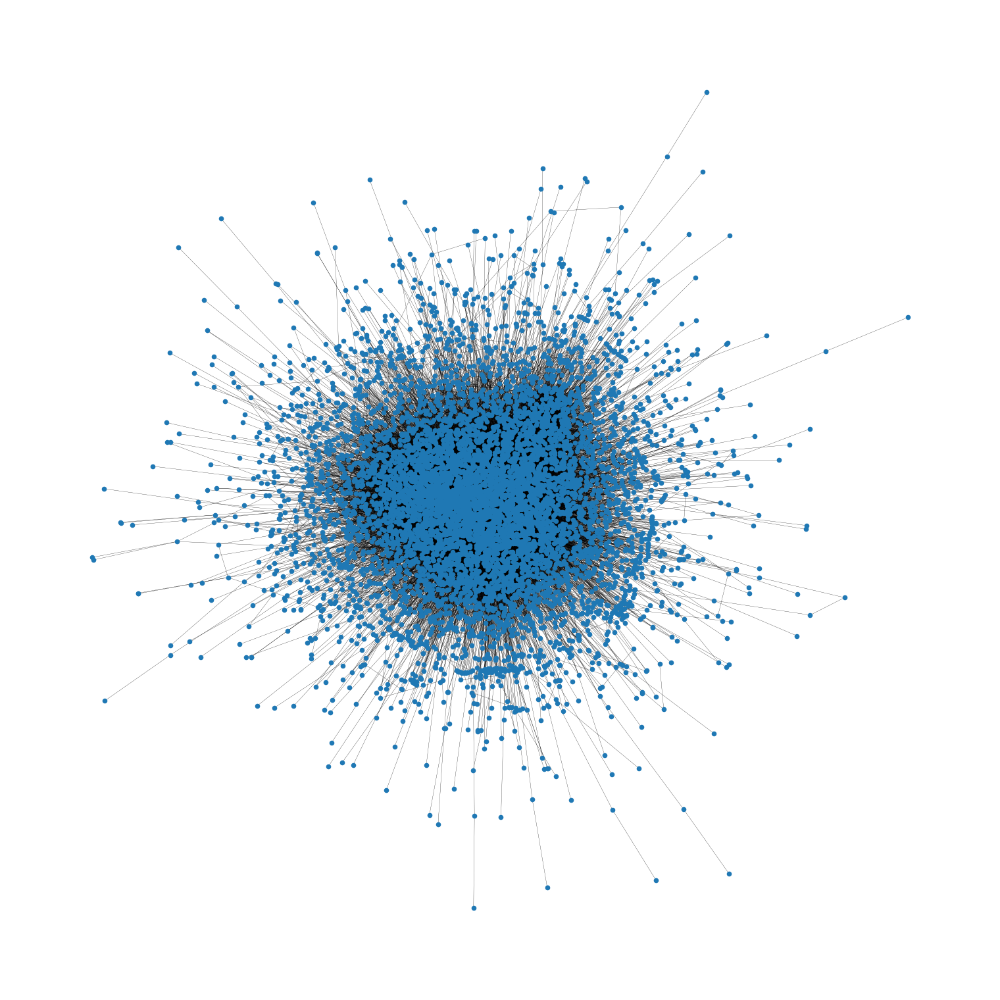

In [91]:

plt.figure(figsize=(15, 15))
plt.clf()
nx.draw(G, pos = None,
        with_labels=False,
        node_size=20,
        width=0.2)
plt.savefig("filename1.png")

Too many nodes to be readable, will try to filter further and cluster

In [92]:
print(G)

Graph with 7126 nodes and 35324 edges


#Making a list and filtering out small viewcount nodes

In [93]:
#Making a list of nodes with under 100000 viewers
filtered_data = [x for x,y in G.nodes(data=True) if int(y['views']) < 100000]

#Removing the nodes in the list from the graph
G.remove_nodes_from(filtered_data)

In [94]:
filtered_data

['2299',
 '153',
 '397',
 '5623',
 '5875',
 '3346',
 '6930',
 '6367',
 '1434',
 '5122',
 '4790',
 '4919',
 '575',
 '639',
 '7012',
 '6445',
 '1170',
 '4956',
 '2639',
 '5028',
 '6277',
 '6784',
 '49',
 '4526',
 '4108',
 '1171',
 '2568',
 '5731',
 '1760',
 '6707',
 '2019',
 '634',
 '4670',
 '2399',
 '5737',
 '6974',
 '6919',
 '240',
 '5646',
 '158',
 '3298',
 '2354',
 '1161',
 '3499',
 '5655',
 '5295',
 '6468',
 '3872',
 '72',
 '544',
 '4228',
 '2430',
 '576',
 '5986',
 '3707',
 '809',
 '593',
 '2456',
 '6911',
 '3362',
 '7101',
 '7060',
 '6080',
 '5771',
 '5914',
 '6794',
 '3361',
 '3260',
 '936',
 '3837',
 '2233',
 '3468',
 '5540',
 '6304',
 '3284',
 '1376',
 '4702',
 '6480',
 '5021',
 '6756',
 '2533',
 '6062',
 '5956',
 '1636',
 '1524',
 '1385',
 '119',
 '3213',
 '4487',
 '839',
 '6165',
 '1150',
 '701',
 '1794',
 '3998',
 '4923',
 '542',
 '7074',
 '4315',
 '5915',
 '948',
 '799',
 '6513',
 '413',
 '3811',
 '1923',
 '5383',
 '1920',
 '3555',
 '1893',
 '5490',
 '3977',
 '2265',
 '661'

#Visualising filtered network and removing isolated nodes

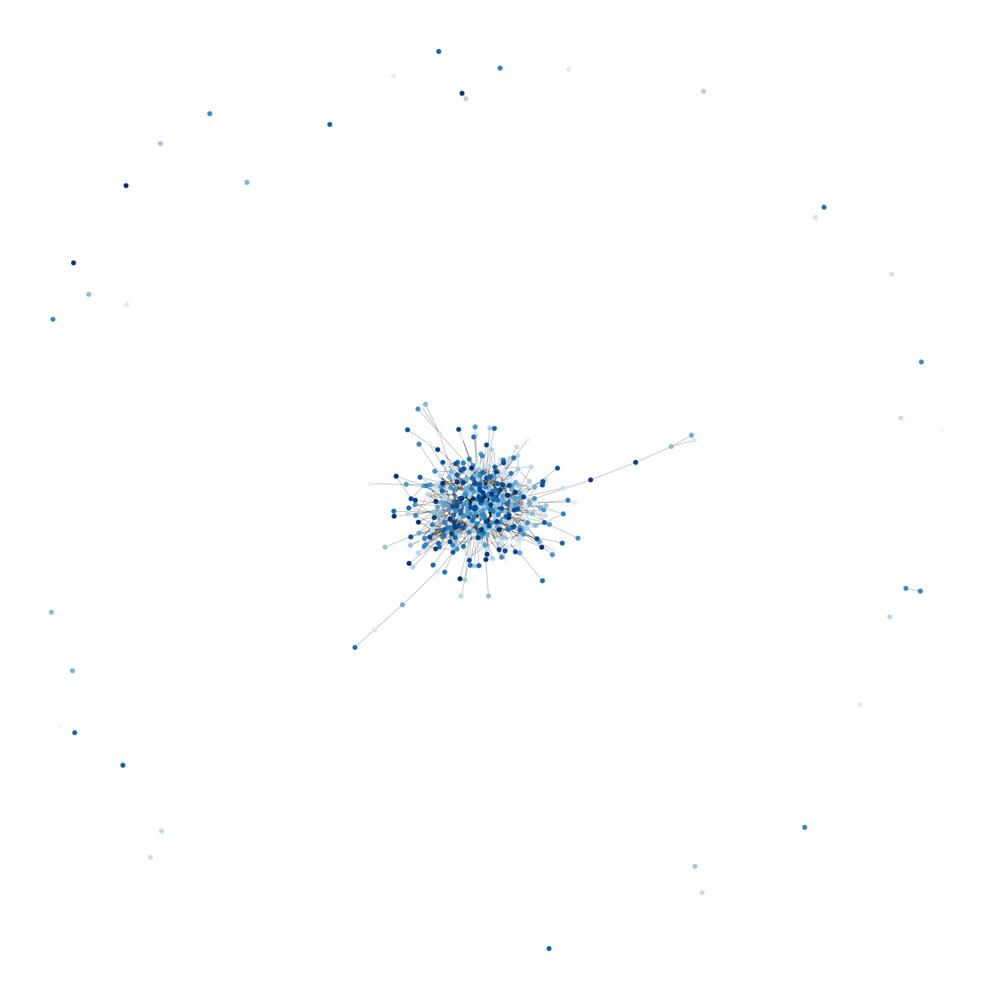

In [95]:
#Showing graph with filtered nodes
plt.figure(figsize=(15, 15))
plt.clf()
nx.draw(G, pos = None,
        with_labels=False,
        node_size=20,
        width=0.2,
        node_color=range(507),
        cmap=plt.cm.Blues)
plt.savefig("filename2.png")

In [96]:
#I have no idea why I have to make these dictionaries again but it works :)
d = dict(G.degree)

dv = dict(G.nodes('views'))

for x in dv.keys():
  dv[x] = int(dv[x])

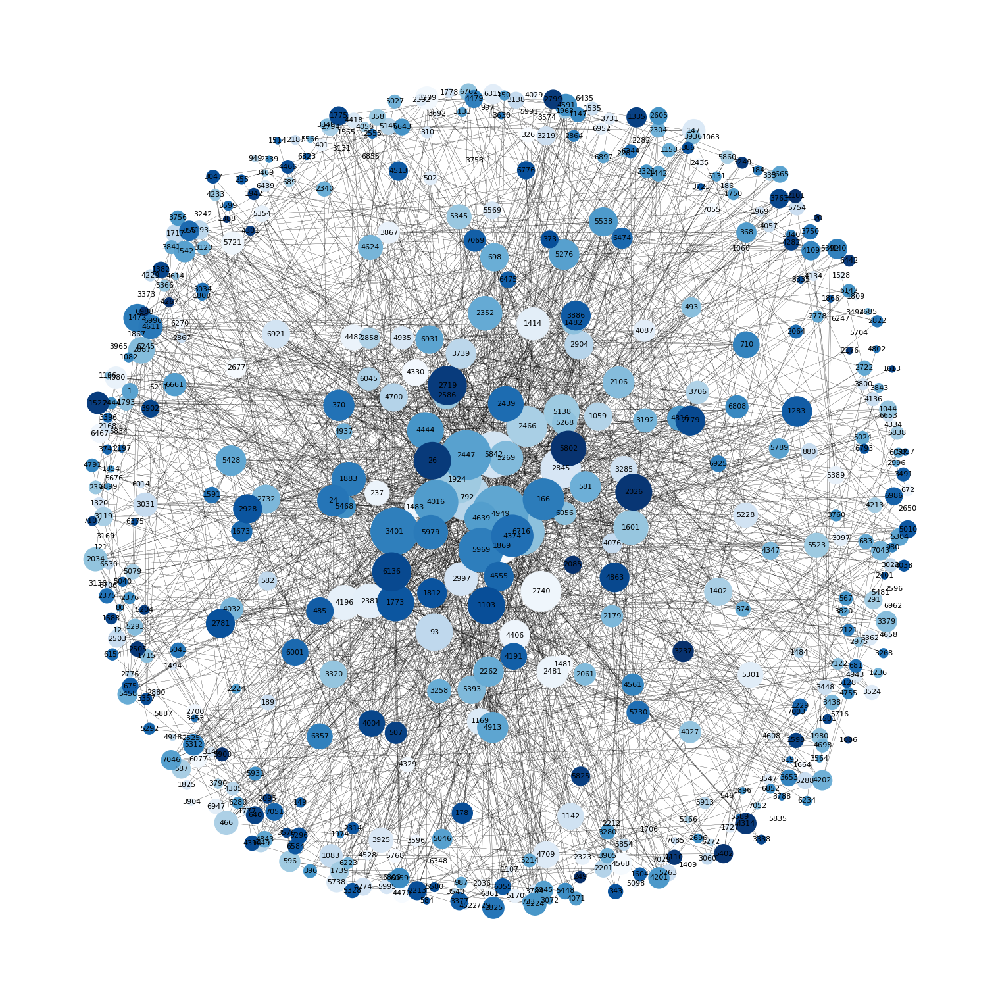

In [97]:
#Showing graph with filtered nodes and sorting by degree
plt.figure(figsize=(15, 15))
plt.clf()
nx.draw(G, pos = nx.spring_layout(G, k = 1, scale=100),
        with_labels=True,
        node_size=[v * 50 for v in d.values()],
        width=0.2,
        font_size=8,
        node_color=range(507),
        cmap=plt.cm.Blues)
plt.savefig("filename2_degree.png")

In [98]:
dv = dict(G.nodes('views'))

for x in dv.keys():
  dv[x] = int(dv[x])

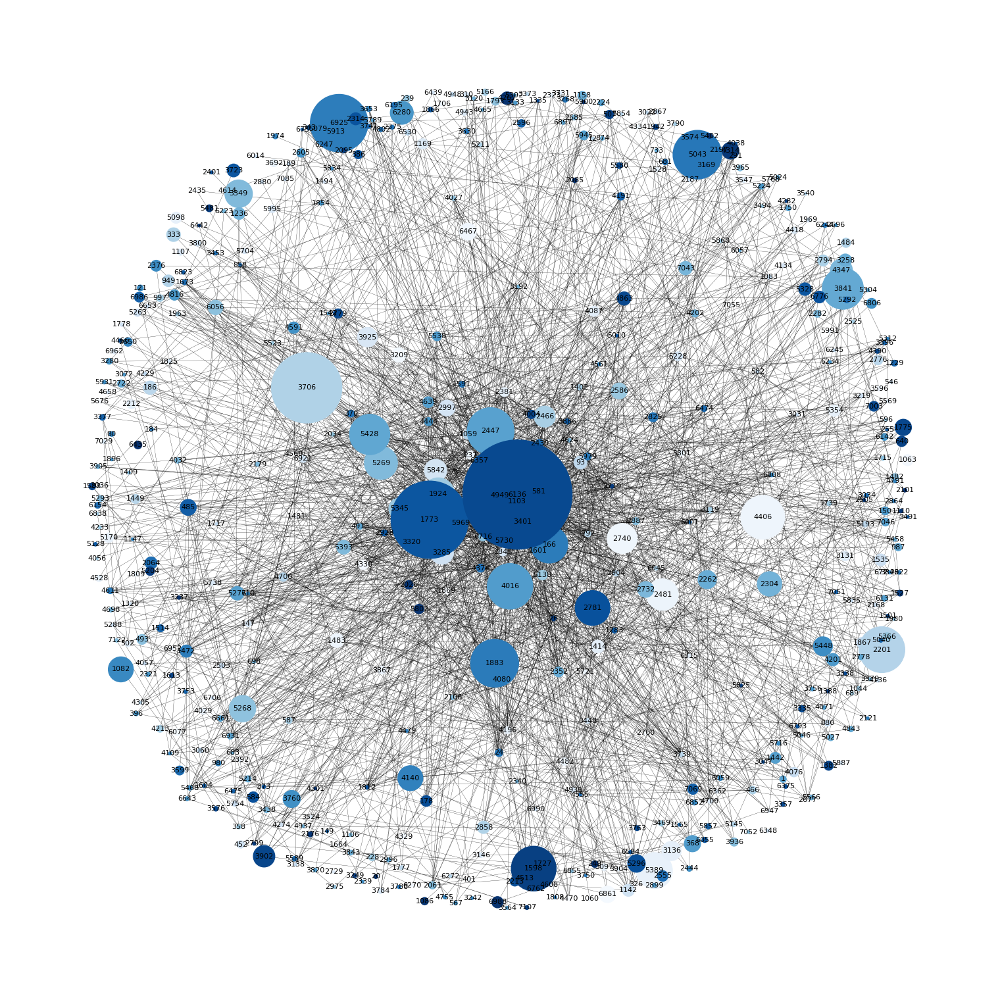

In [99]:
#Showing graph with filtered nodes and sorting by viewcount
plt.figure(figsize=(15, 15))
plt.clf()
nx.draw(G, pos = nx.spring_layout(G, k = 1, scale=100),
        with_labels=True,
        node_size=[v * 0.00008 for v in dv.values()],
        width=0.2,
        font_size=8,
        node_color=range(507),
        cmap=plt.cm.Blues)
plt.savefig("filename2_views.png")

In [100]:
print(G)

Graph with 507 nodes and 2054 edges


In [101]:
"""#Removing isolate nodes
G.remove_nodes_from(list(nx.isolates(G)))"""

'#Removing isolate nodes\nG.remove_nodes_from(list(nx.isolates(G)))'

#Sorting the node sizes by degree which essentially shows the most connected streamers

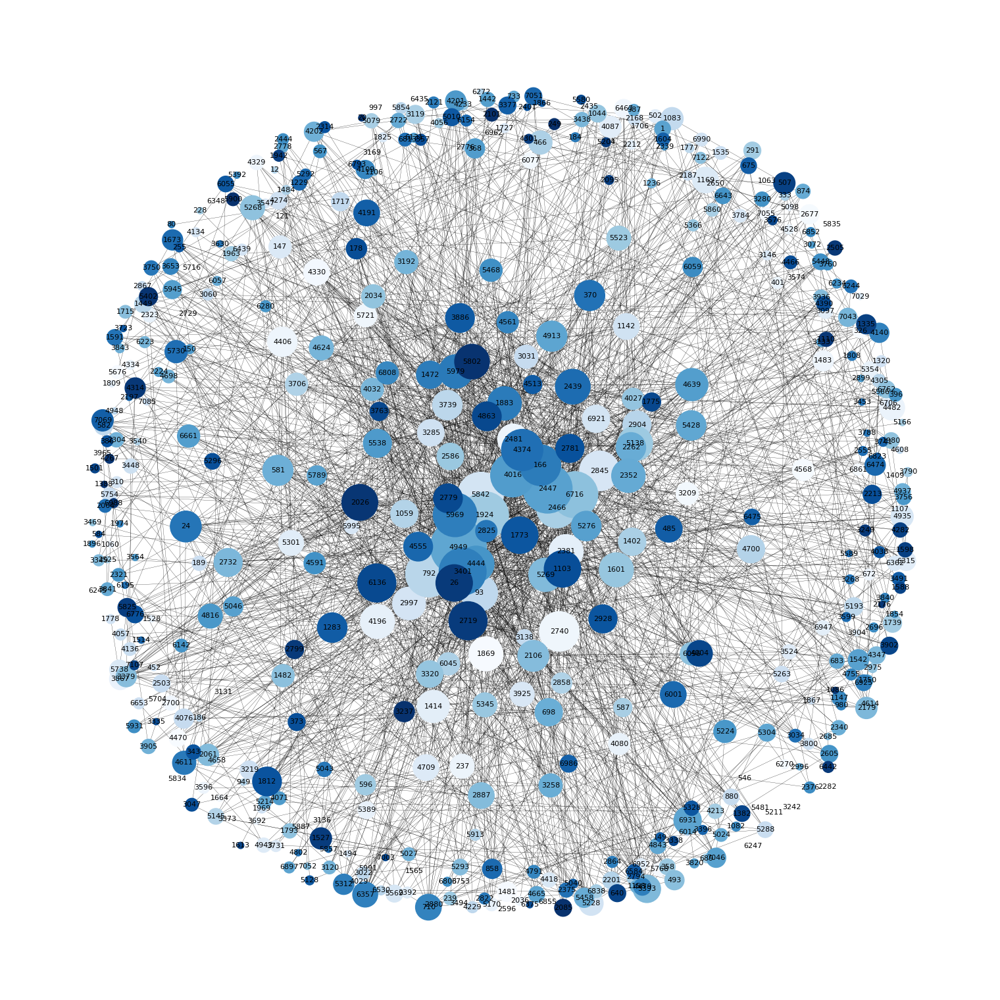

In [102]:
plt.figure(figsize=(15, 15))
plt.clf()
nx.draw(G, pos = nx.spring_layout(G, k = 1, scale=100),
        with_labels=True,
        node_size=[v * 50 for v in d.values()],
        width=0.2,
        font_size=8,
        node_color=range(507),
        cmap=plt.cm.Blues)
plt.savefig("filename3.png")

In [103]:
print(G)

Graph with 507 nodes and 2054 edges


In [104]:
view_size = nx.get_node_attributes(G, 'views')

print(view_size)

{'4470': '313084', '326': '115054', '1869': '488224', '5676': '212170', '2677': '106623', '4568': '127832', '5768': '311606', '1481': '110677', '7055': '104481', '6861': '4014190', '4330': '1400701', '1664': '153891', '3209': '3090544', '6077': '676893', '1063': '1852325', '2435': '104909', '5991': '226172', '6270': '139157', '2700': '118412', '6467': '4193445', '2740': '13481914', '5721': '234674', '4406': '28680584', '1483': '2878382', '2036': '183636', '4329': '596415', '3596': '304123', '672': '260098', '237': '1027237', '2481': '14914146', '1706': '271830', '4482': '859702', '4334': '251536', '401': '160579', '1060': '127625', '3867': '929599', '3692': '792374', '4080': '208894', '5389': '19381506', '5170': '1344672', '2323': '273614', '5354': '1918285', '4029': '516588', '5098': '1832724', '4528': '581087', '4196': '717298', '1528': '236013', '3136': '5477528', '2212': '1156712', '2381': '1182363', '3097': '643122', '1809': '210677', '6947': '104162', '1414': '2488519', '6315': '

In [105]:
print(G.nodes)

G.nodes['4470']

['4470', '326', '1869', '5676', '2677', '4568', '5768', '1481', '7055', '6861', '4330', '1664', '3209', '6077', '1063', '2435', '5991', '6270', '2700', '6467', '2740', '5721', '4406', '1483', '2036', '4329', '3596', '672', '237', '2481', '1706', '4482', '4334', '401', '1060', '3867', '3692', '4080', '5389', '5170', '2323', '5354', '4029', '5098', '4528', '4196', '1528', '3136', '2212', '2381', '3097', '1809', '6947', '1414', '6315', '4087', '6952', '5301', '6962', '502', '3904', '3131', '3524', '2729', '2392', '4943', '4709', '1727', '7029', '1169', '3731', '3547', '6362', '147', '3146', '1107', '4418', '5738', '1825', '3925', '3784', '4935', '2845', '5995', '5569', '4134', '4658', '310', '5887', '2997', '6439', '6921', '5842', '5704', '1494', '5228', '6990', '1320', '1778', '1142', '452', '1969', '4274', '2168', '3285', '6706', '6653', '3448', '3800', '5263', '3219', '1535', '2880', '5754', '189', '546', '4136', '2187', '6014', '5288', '6348', '1867', '2503', '4057', '880', '7085', '2

{'days_streaming': '973',
 'streamer_mature_rating': 'False',
 'views': '313084',
 'twitch_partner': 'False',
 'id': '4470'}

#Sorting node sizes based on viewcount

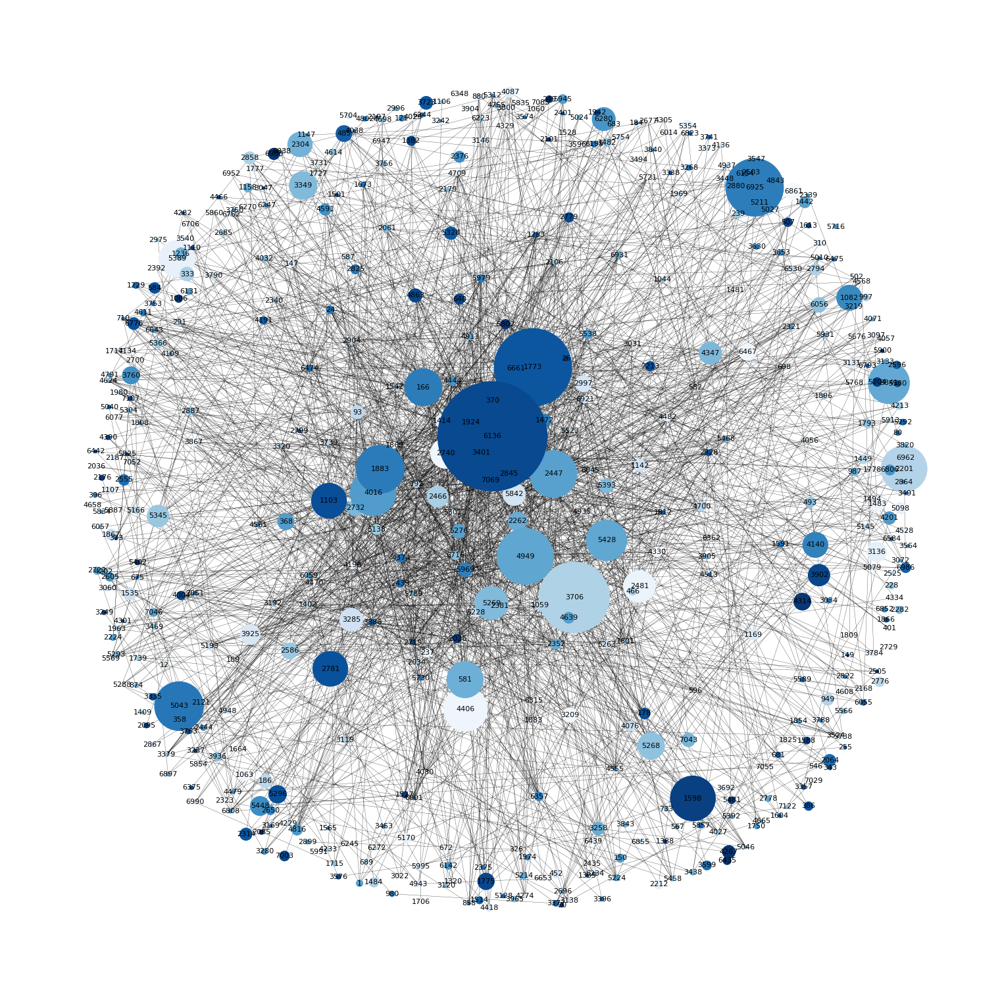

In [106]:
plt.figure(figsize=(15, 15))
plt.clf()
nx.draw(G, pos = nx.spring_layout(G, k = 1),
        with_labels=True,
        node_size=[v * 0.00008 for v in dv.values()],
        width=0.2,
        font_size=8,
        node_color=range(507),
        cmap=plt.cm.Blues)
plt.savefig("filename4.png")

In [107]:
print(G)

Graph with 507 nodes and 2054 edges


In [108]:
density = nx.density(G)
print("Network density:", density)

Network density: 0.016012972534711664


In [109]:
nx.average_degree_connectivity(G, weight='views')

{7: 20.529761904761905,
 5: 20.823809523809523,
 28: 23.133928571428573,
 4: 21.96875,
 9: 20.625,
 11: 19.335664335664337,
 3: 21.094202898550726,
 16: 21.770833333333332,
 1: 16.823529411764707,
 12: 20.633333333333333,
 6: 19.15277777777778,
 0: 0,
 2: 18.308333333333334,
 8: 19.15972222222222,
 38: 21.039473684210527,
 21: 19.41269841269841,
 10: 21.816666666666666,
 14: 24.794642857142858,
 23: 22.3768115942029,
 15: 21.333333333333332,
 25: 22.14,
 26: 24.76923076923077,
 18: 21.493055555555557,
 50: 20.1,
 17: 20.970588235294116,
 13: 19.564102564102566,
 32: 17.3671875,
 51: 22.54901960784314,
 19: 23.126315789473683,
 39: 17.0,
 53: 17.38679245283019,
 29: 24.229885057471265,
 27: 21.63888888888889,
 22: 22.606060606060606,
 75: 16.066666666666666,
 58: 17.96551724137931,
 46: 20.58695652173913,
 31: 17.661290322580644,
 40: 10.875,
 41: 17.75609756097561,
 20: 21.09,
 35: 16.185714285714287}